In [1]:
library(RSNNS)
library(NeuralNetTools)

Loading required package: Rcpp



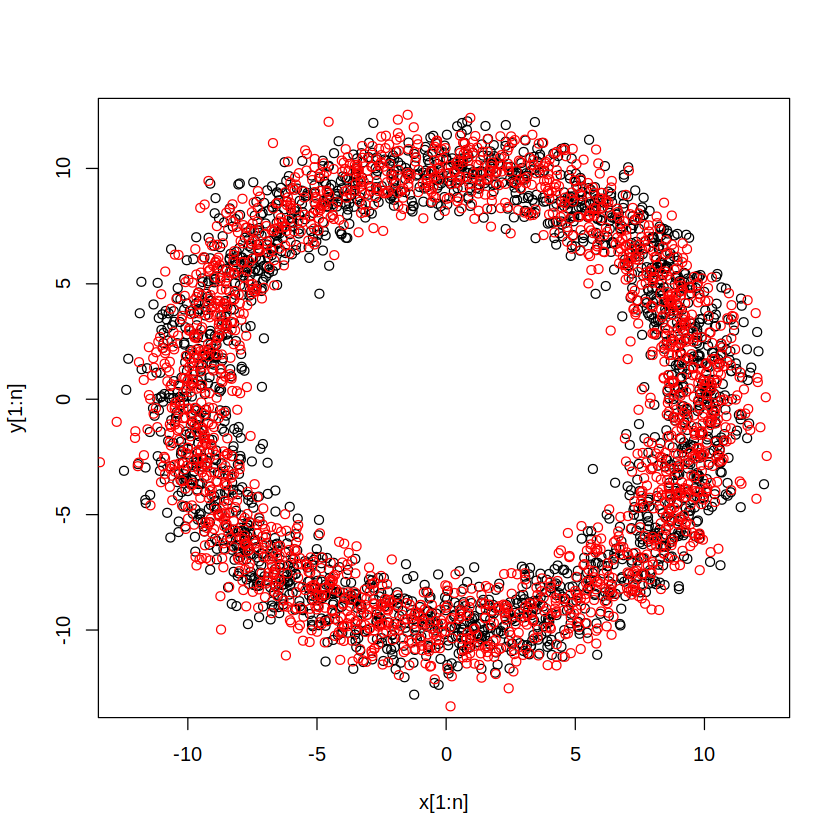

In [43]:
# create a sample x vs y whose radius is gaussian and theta uniform
n=2000 # size
sig=1  # spread
muestra1=10 #mean radius sample A 
muestra2=10  #mean radius sample B

r=rnorm(n,muestra1,sig)
th=runif(n,0,2*pi)
r2=rnorm(n,muestra2,sig)
th2=runif(n,0,2*pi)
x=c(r*cos(th),r2*cos(th2))
y=c(r*sin(th),r2*sin(th2))
plot(x[1:n],y[1:n]) # plot to check
lines(x[(n+1):(2*n)],y[(n+1):(2*n)],type="p",col="red") # plot to check

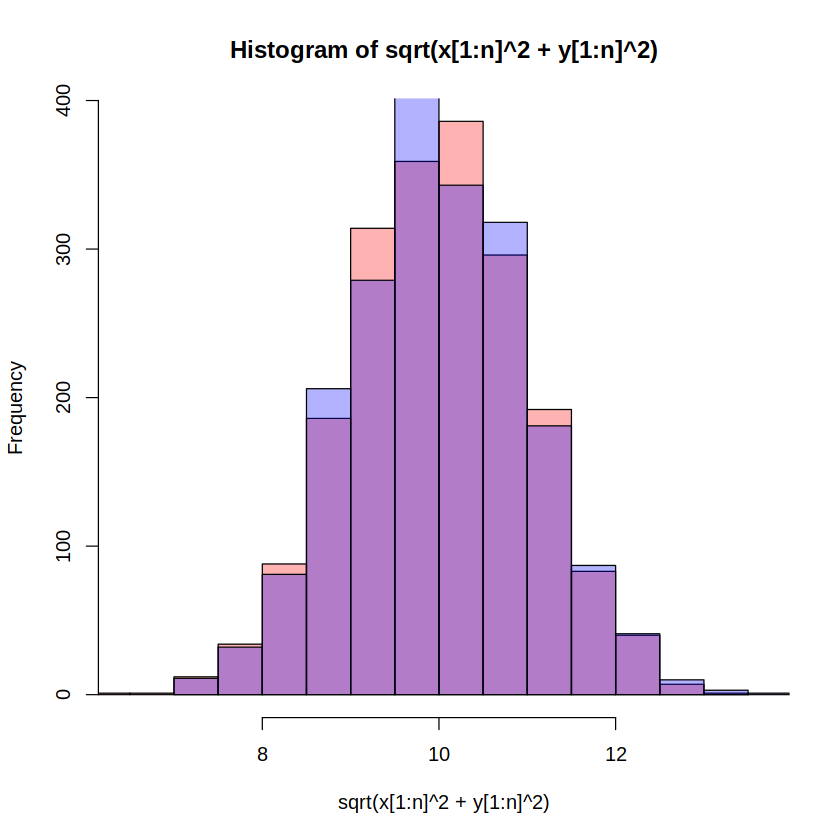

In [44]:
hist(sqrt(x[1:n]^2+y[1:n]^2),col=rgb(1,0,0,0.3),xlim=sqrt(c(min(x^2+y^2),max(x^2+y^2)))) #radial view
hist(sqrt(x[(n+1):(2*n)]^2+y[(n+1):(2*n)]^2),add=T,col=rgb(0,0,1,0.3)) #radial view

In [52]:
# create a labelled data frame, vars and target (1, 0)
trai=data.frame(x,y,c(rep(1,n),rep(0,n)))
colnames(trai)=c("x","y","tr")
# some operations to mix classes
nc=ncol(trai)
trai=trai[sample(1:nrow(trai),length(1:nrow(trai))),1:nc]
Values <- trai[,1:nc-1]
#Targets <- decodeClassLabels(trai[,nc]) # Internal RSNNS function to illustrate with iris
Targets <- trai[,nc] 
# split 15% of the sample for test
trai <- splitForTrainingAndTest(Values, Targets, ratio=0.15)
#normalize/preprocess
#trai <- normTrainingAndTestSet(trai,type="0_1") # norm 0_1 o center 
str(trai)
# size defines the topology size=n one hidden with n neurons, size=c(n,m,s), three layers with n,m,s
# outputActFunc, activation function
# learnFunc learning type with learnFuncParams defining the parameter(s) i.e. learning rate, momentum
# maxit number of iterations 
#http://www.ra.cs.uni-tuebingen.de/SNNS/UserManual/node52.html
model <- mlp(trai$inputsTrain,trai$targetsTrain,size=c(20,20),
             inputsTest = trai$inputsTest, targetsTest = trai$targetsTest,
             outputActFunc = "Act_Logistic",
#             learnFunc = "Std_Backpropagation",learnFuncParams = c(0.1),
             learnFunc = "BackpropMomentum",learnFuncParams = c(0.1,0.1), 
#             learnFunc = "SCG", learnFuncParams = c(0.1),
              maxit = 300)

List of 4
 $ inputsTrain : num [1:3400, 1:2] -6.59 3.33 -9.35 8.03 -4.77 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:3400] "3880" "496" "2934" "1799" ...
  .. ..$ : chr [1:2] "x" "y"
 $ targetsTrain: num [1:3400] 0 1 0 1 1 1 1 1 1 0 ...
 $ inputsTest  : num [1:600, 1:2] -3.438 9.073 6.217 0.165 10.439 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:600] "299" "2117" "1366" "3896" ...
  .. ..$ : chr [1:2] "x" "y"
 $ targetsTest : num [1:600] 1 0 1 0 1 1 0 0 0 1 ...


In [53]:
summary(model) #summarize results

SNNS network definition file V1.4-3D
generated at Mon Dec 19 12:24:54 2022

network name : RSNNS_untitled
source files :
no. of units : 43
no. of connections : 460
no. of unit types : 0
no. of site types : 0


learning function : BackpropMomentum
update function   : Topological_Order


unit default section :

act      | bias     | st | subnet | layer | act func     | out func
---------|----------|----|--------|-------|--------------|-------------
 0.00000 |  0.00000 | i  |      0 |     1 | Act_Logistic | Out_Identity 
---------|----------|----|--------|-------|--------------|-------------


unit definition section :

no. | typeName | unitName    | act      | bias     | st | position | act func     | out func | sites
----|----------|-------------|----------|----------|----|----------|--------------|----------|-------
  1 |          | Input_x     | -0.29434 |  0.29684 | i  |  1, 0, 0 | Act_Identity |          | 
  2 |          | Input_y     |  9.26914 | -0.07856 | i  |  2, 0, 0 | Act_Ide

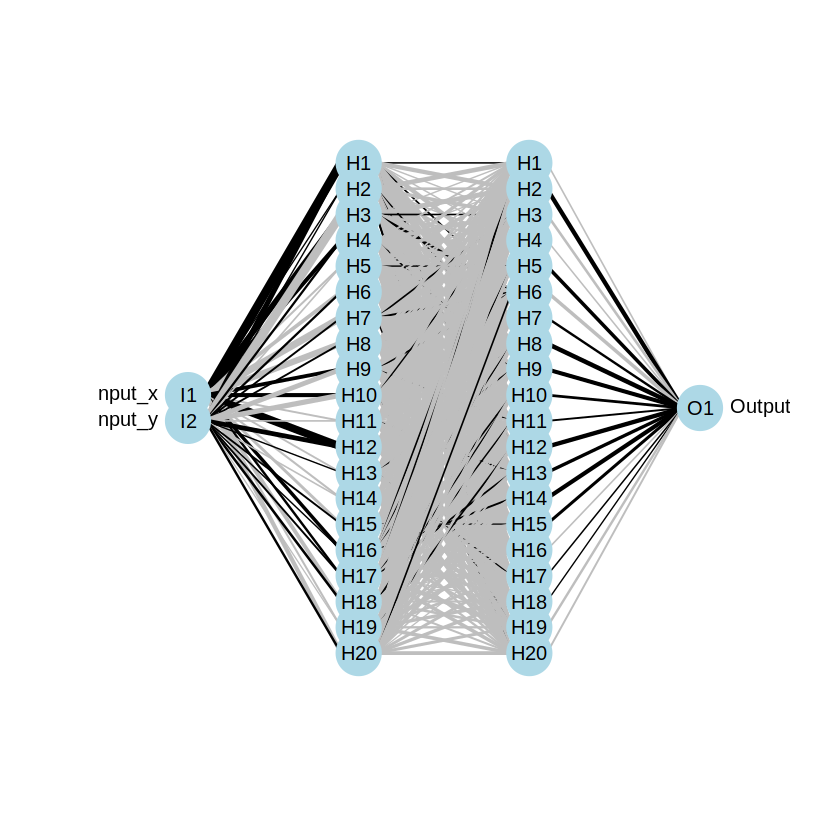

In [54]:
plotnet(model) #plot the network with weight importance drawn with the line thickness

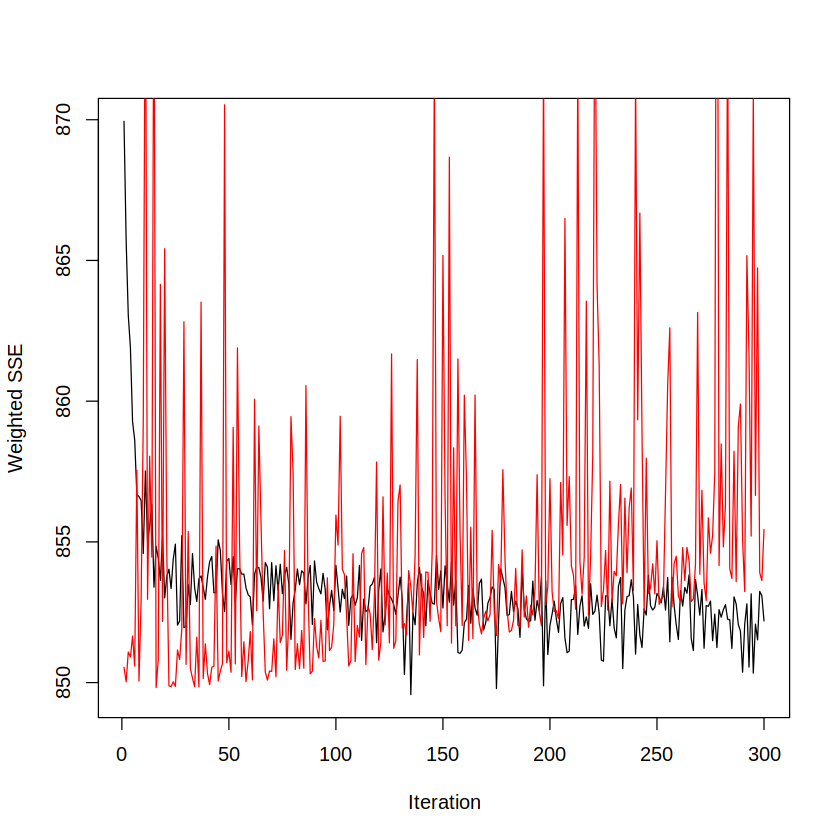

In [55]:
plotIterativeError(model)   #plots the error function evolution for test and validation

[1] NA

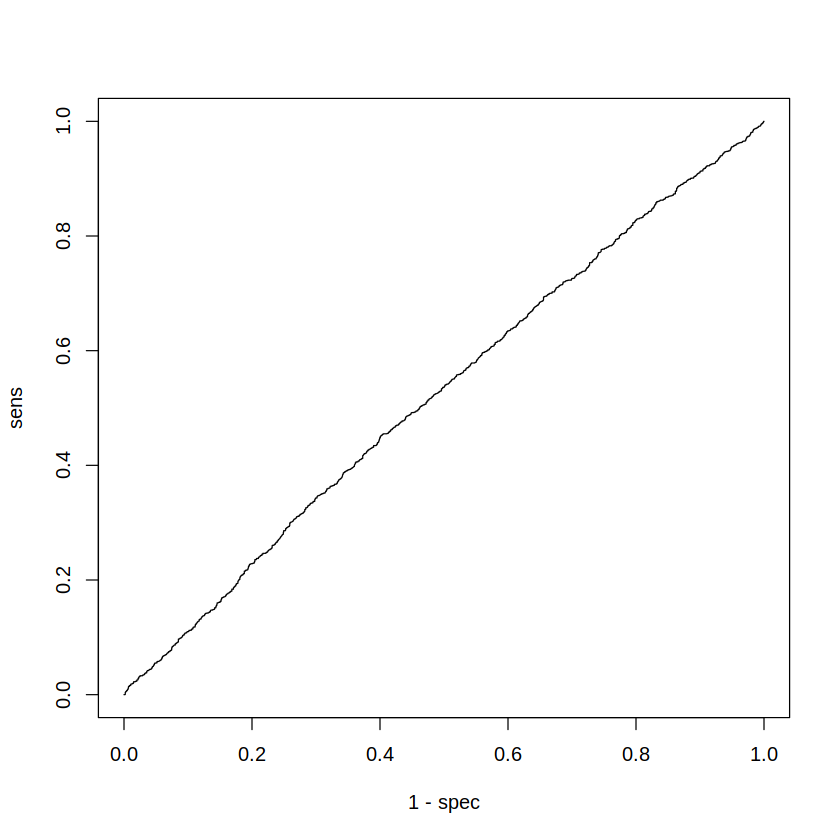

In [56]:
sum(model$fitted.values[Targets==0]>0.5)
plotROC(model$fitted.values,Targets)

$names
 [1] "nInputs"               "maxit"                 "initFunc"             
 [4] "initFuncParams"        "learnFunc"             "learnFuncParams"      
 [7] "updateFunc"            "updateFuncParams"      "shufflePatterns"      
[10] "computeIterativeError" "snnsObject"            "archParams"           
[13] "IterativeFitError"     "IterativeTestError"    "fitted.values"        
[16] "fittedTestValues"      "nOutputs"             

$class
[1] "mlp"   "rsnns"

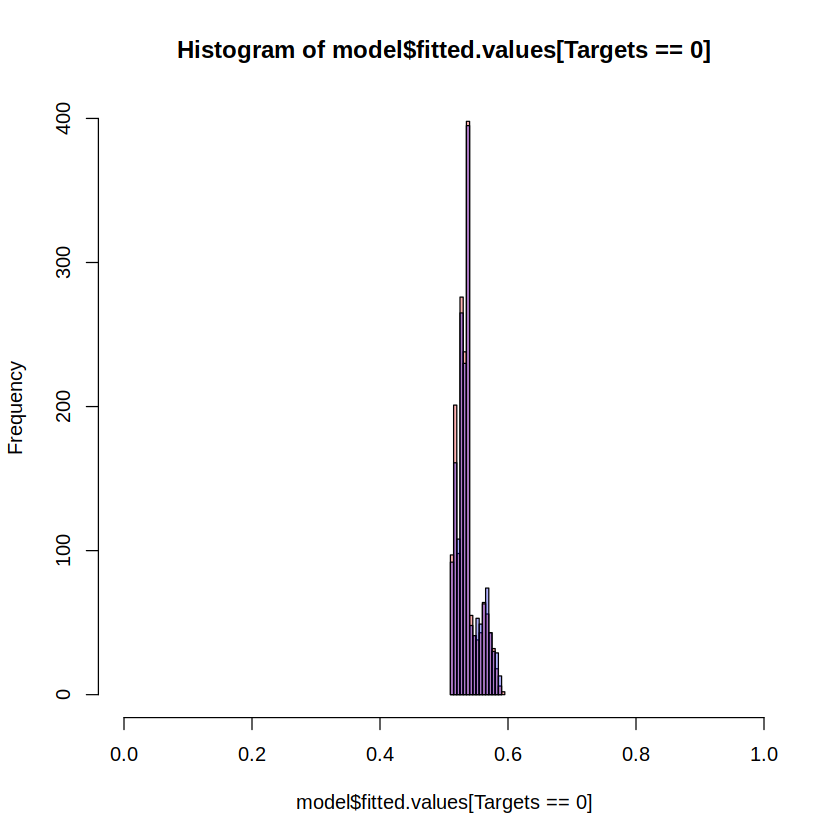

In [57]:
attributes(model)
hist(model$fitted.values[Targets==0],col=rgb(1,0,0,0.3),xlim=c(0,1))
hist(model$fitted.values[Targets==1],col=rgb(0,0,1,0.3),add=T)

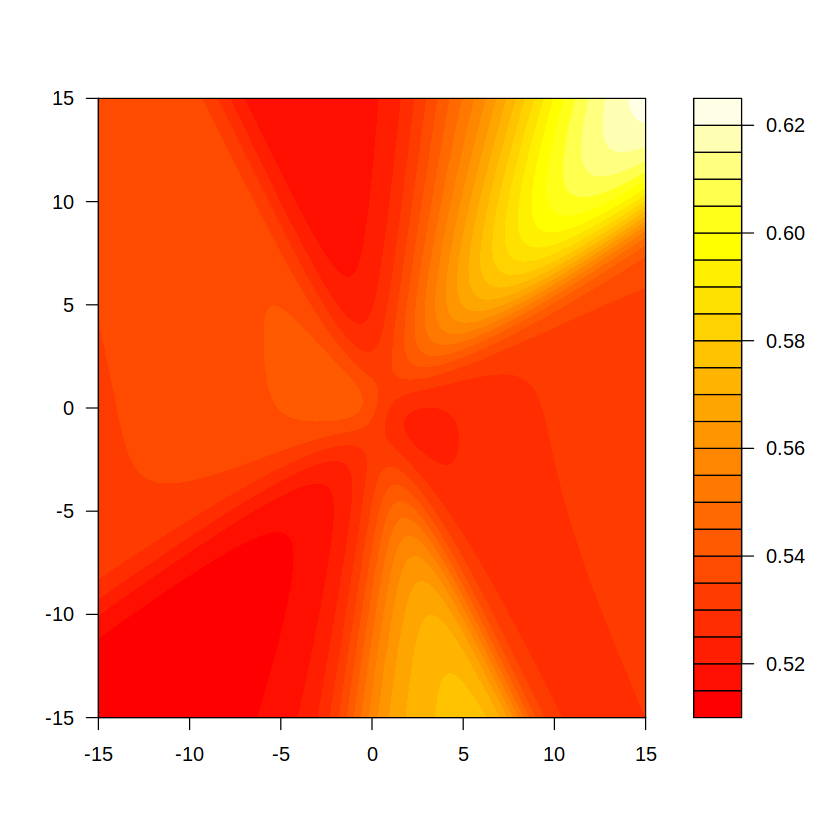

In [58]:
# build a 2D heat map with the prediction, predict
xn=seq(-15,15,by=0.2)
yn=seq(-15,15,by=0.2)
out=outer(xn,yn,function(x,y){predict(model,data.frame(x,y))})
filled.contour(xn,yn,out,color=heat.colors)
#contour(xn,yn,out)